# StarDist Segmentation - LifeAnalytics Application
by Mlachahe SAID SALIMO

## Setup Libraries

In [71]:
!pip install stardist

In [72]:
from stardist.models import StarDist2D
from stardist.data import test_image_nuclei_2d
from stardist.plot import render_label
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
from csbdeep.utils import normalize

import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

from PIL import Image
import numpy as np
from datetime import datetime
from skimage import color, io
from glob import glob

import os


## Load the model

In [73]:
# prints a list of available models
StarDist2D.from_pretrained()

There are 4 registered models for 'StarDist2D':

Name                  Alias(es)
────                  ─────────
'2D_versatile_fluo'   'Versatile (fluorescent nuclei)'
'2D_versatile_he'     'Versatile (H&E nuclei)'
'2D_paper_dsb2018'    'DSB 2018 (from StarDist 2D paper)'
'2D_demo'             None


Define a pretrained model to segment nuclei in fluorescence images (download from pretrained) because it will be more adapted for our problems

In [74]:
model = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


## Define the Folders

#### Define Project Folder

In [75]:
# Define the project directory path
PROJECT_DIR_PATH = '/content/drive/MyDrive/Colab Notebooks/StarDist'
print('PROJECT_DIR_PATH:', PROJECT_DIR_PATH)

print("> Available: ", os.listdir(PROJECT_DIR_PATH))

PROJECT_DIR_PATH: /content/drive/MyDrive/Colab Notebooks/StarDist
> Available:  ['StartDist_LifeAnalytics.ipynb', 'data_test', '.ipynb_checkpoints', 'output_2D_versatile_fluo_2024-04-30']


#### Define Data Folder

In [76]:
# Define the data directory path
DATA_DIR_PATH = os.path.join(PROJECT_DIR_PATH, 'data_test')
print('DATA_DIR_PATH:', DATA_DIR_PATH)

DATA_DIR_PATH: /content/drive/MyDrive/Colab Notebooks/StarDist/data_test


#### Create the output folder

In [77]:
current_time = datetime.now().strftime('%Y-%m-%d-%H') # horodatage

RESULTS_DIR_PATH = os.path.join(PROJECT_DIR_PATH, f'output_2D_versatile_fluo_{current_time}')


SEGMENTEDVIEWS_RESULTS_DIR_PATH = os.path.join(RESULTS_DIR_PATH, f'segmented_views')
OVERVIEWS_RESULTS_DIR_PATH = os.path.join(RESULTS_DIR_PATH, f'overviews')

# Create the folders if they dont exist
os.makedirs(RESULTS_DIR_PATH, exist_ok=True)
os.makedirs(SEGMENTEDVIEWS_RESULTS_DIR_PATH, exist_ok=True)
os.makedirs(OVERVIEWS_RESULTS_DIR_PATH, exist_ok=True)

print('RESULTS_DIR_PATH:', RESULTS_DIR_PATH)
print("> Available: ", os.listdir(RESULTS_DIR_PATH))

RESULTS_DIR_PATH: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23
> Available:  ['segmented_views', 'overviews']


## Collect the Data

In [78]:
# Collect both .tif and .jpg files
tif_files = sorted(glob(DATA_DIR_PATH + '/*.tif'))
jpg_files = sorted(glob(DATA_DIR_PATH + '/*.jpg'))

# Combine the lists of files
IMAGES_PATH_LIST = sorted(tif_files + jpg_files)

print("> IMAGES_PATH_LIST:", IMAGES_PATH_LIST)

> IMAGES_PATH_LIST: ['/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00001_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00002_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00007_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00008_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00009_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00010_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00011_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00012_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_XY10_00013_CH3.tif', '/content/drive/MyDrive/Colab Notebooks/StarDist/data_test/Muc1_Ecad_SPC_x20_2_

## Tools

In [79]:
class MediaPlayer:

    @staticmethod
    def display_images(images, titles=None, x_labels=None, suptitle=None, cmaps=None, details=None, save_path=None):
        """
        Displays a sequence of images with optional titles and X-axis labels.

        :param images: List of images to display.
        :param titles: List of titles for each image. If None, no titles are displayed.
        :param x_labels: List of X-axis labels for each image. If None, no labels are displayed.
        :param cmaps: List of colormaps to use for displaying each image.
                       If None, 'gray' is used for all images.
        """
        num_images = len(images)
        if titles is None:
            titles = [''] * num_images  # Create an empty list of titles if none are provided
        if x_labels is None:
            x_labels = [''] * num_images  # Create an empty list of X-axis labels if none are provided
        if cmaps is None:
            cmaps = [None] * num_images  # Use 'gray' for all images if no list is provided

        assert len(titles) == num_images, "The number of images must match the number of titles."
        assert len(x_labels) == num_images, "The number of images must match the number of X-axis labels."
        assert len(cmaps) == num_images, "The number of images must match the number of colormaps."

        plt.figure(figsize=(num_images * 4, 4))  # Adjust the figure size based on the number of images
        plt.suptitle(suptitle, fontsize=15, y=0.93)
        for i, image in enumerate(images):
            ax = plt.subplot(1, len(images), i + 1)
            ax.imshow(image, cmap=cmaps[i] if cmaps[i] else 'gray')
            ax.set_title(titles[i])
            ax.set_xlabel(x_labels[i])

            if details and details[i]:
                # Draw polygons with distances
                coord, points, prob = details[i]['coord'], details[i]['points'], details[i]['prob']
                _draw_polygons(coord, points, prob, show_dist=True)

        # Save the plot to the directory if save_dir_path is provided and not empty
        if save_path:
            plt.savefig(save_path)
            print(f"Saved plot to {save_path}")

        plt.tight_layout()
        plt.show()

## Data

#### Collect the Data

#### Store the data collected in a list

In [80]:
IMAGES_PIL_LIST = list(map(Image.open, IMAGES_PATH_LIST))
IMAGES_LIST = list(map(np.array, IMAGES_PIL_LIST)) # Convert PIL to nmpu

Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/data_used_for_the_test.png


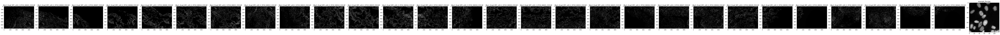

In [81]:
MediaPlayer.display_images(images=IMAGES_LIST,
                           titles=list(map(os.path.basename, IMAGES_PATH_LIST)),
                           save_path=OVERVIEWS_RESULTS_DIR_PATH+'/data_used_for_the_test.png')

## Prediction Example

#### Load one image

[[125 115 107 ...   4   5   6]
 [109 107  95 ...   4   5   6]
 [ 86  83  66 ...   5   5   6]
 ...
 [162 164 161 ... 172 156 128]
 [170 164 161 ... 182 155 120]
 [188 170 160 ... 174 152 126]]
shape: (120, 120)


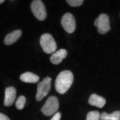

In [82]:
image_path = IMAGES_PATH_LIST[-1] # Pic a test image
image_pil = Image.open(image_path) # IMAGES_PIL_LIST[idx]
image = np.array(image_pil) # IMAGES_LIST[idx]

# Print image properties and unique values (helpful for debugging)
print(image)
print('shape:', image.shape)
#print('unique:', np.unique(segmented_image))

# Visualize the image
image_pil

#### Make prediction with the model

[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [17 17 17 ... 16 16  0]
 [17 17 17 ... 16 16 16]
 [17 17 17 ... 16 16 16]]
shape: (120, 120)
unique: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]
len(unique): 18


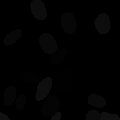

In [83]:
segmented_image, details = model.predict_instances(normalize(image))

# Print image properties and unique values (helpful for debugging)
print(segmented_image)
print('shape:', segmented_image.shape)
print('unique:', np.unique(segmented_image))
print('len(unique):', len(np.unique(segmented_image)))

# Visualize the image
segmented_image_pil = Image.fromarray(segmented_image.astype(np.uint8))#, 'L')
segmented_image_pil

We see that in the output mask image 0 is the background and enconding 1 2 3 4 ect number of values are the rest of each object detected.

So we can compute the number of object easily :

In [84]:
nbr_obj = max(np.unique(segmented_image))

Afterward, we do an overlay in order to highlight

Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/example_original_segmented_overlay.png


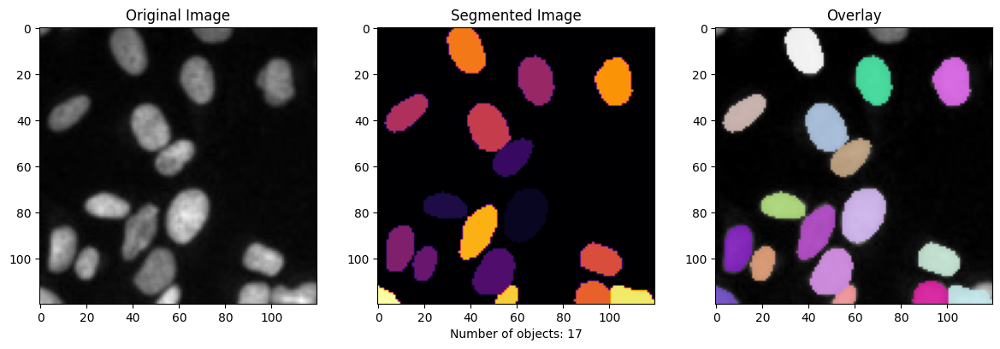

In [85]:
overlay = render_label(segmented_image, img=image, alpha=0.9)


MediaPlayer.display_images(images=[image, segmented_image, overlay],
                                   titles=["Original Image", "Segmented Image", "Overlay"],
                                   x_labels=['', f'Number of objects: {nbr_obj}', ''],
                                   cmaps=[None, 'inferno', None],
                                   details=[None, None, None],
                                save_path=RESULTS_DIR_PATH+'/example_original_segmented_overlay.png')

#### Distances

We exploit the details values extract before

Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/example_distances_computed.png


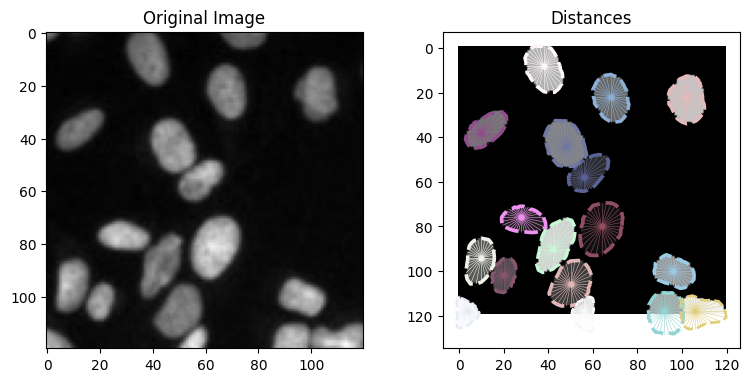

In [86]:
MediaPlayer.display_images(images=[image, segmented_image],
                                   titles=["Original Image", "Distances"],
                                   x_labels=['', ''],
                                   cmaps=[None, None],
                                   details=[None, details],
                                   save_path=RESULTS_DIR_PATH+'/example_distances_computed.png')

We can observe that :
- The entire object is reconstructed.
- The object are detected before some little occlusion.

## Results - Normal Size

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00001_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00001_CH3


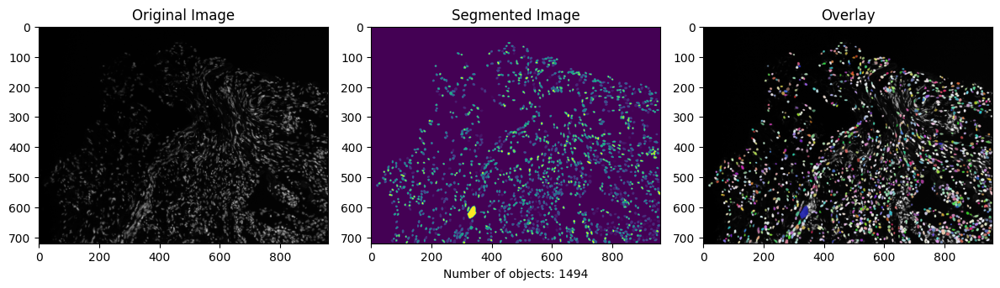

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00002_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00002_CH3


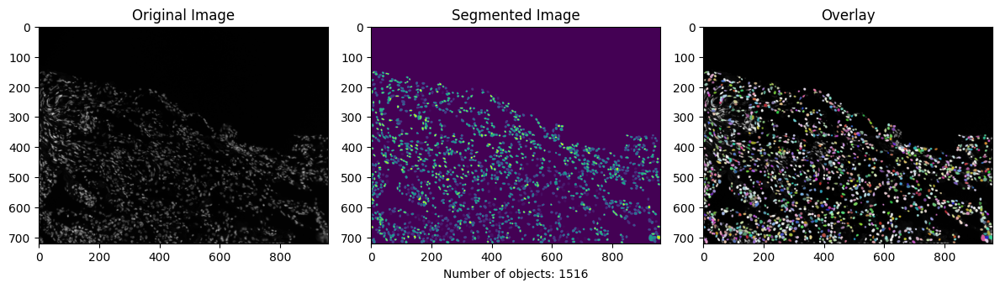

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00007_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00007_CH3


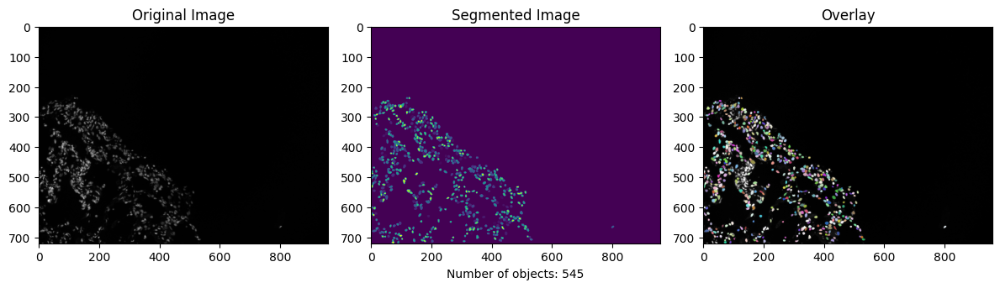

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00008_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00008_CH3


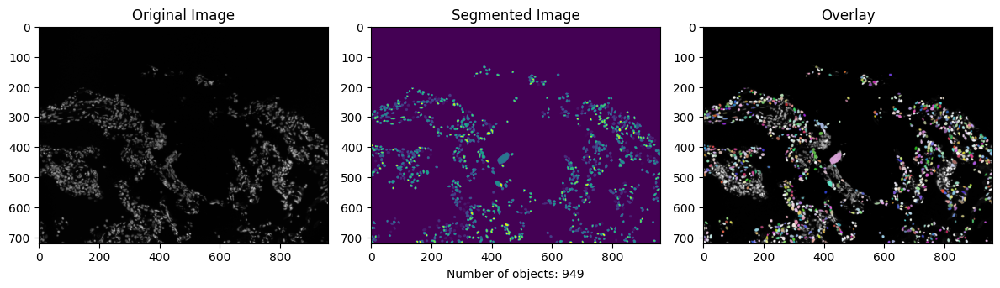

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00009_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00009_CH3


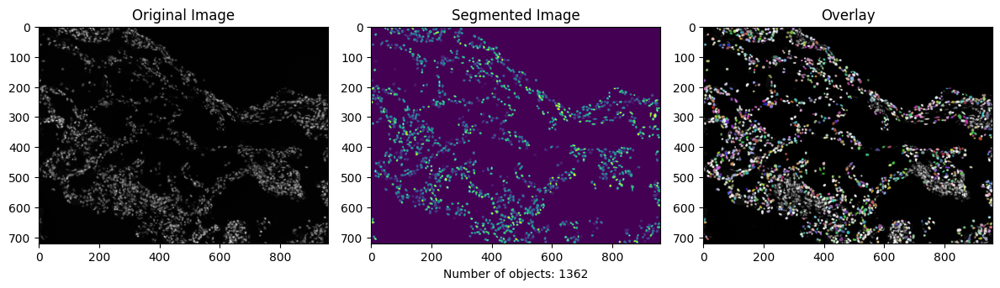

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00010_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00010_CH3


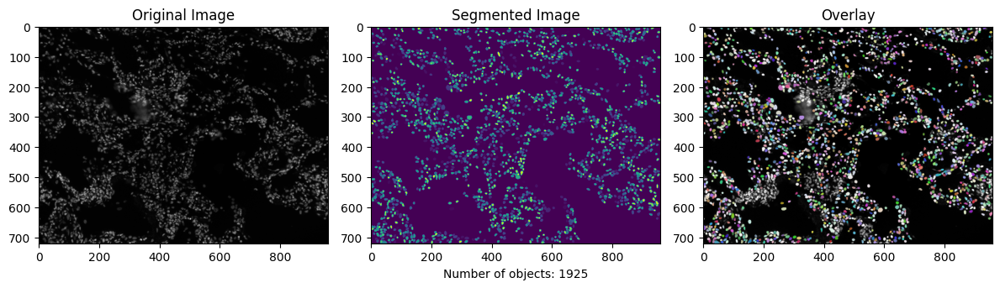

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00011_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00011_CH3


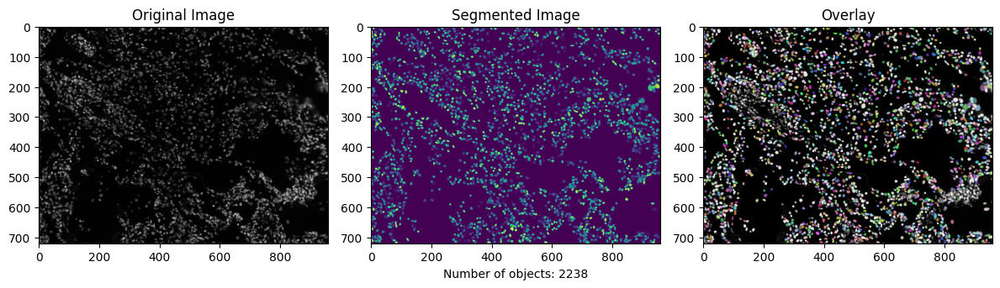

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00012_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00012_CH3


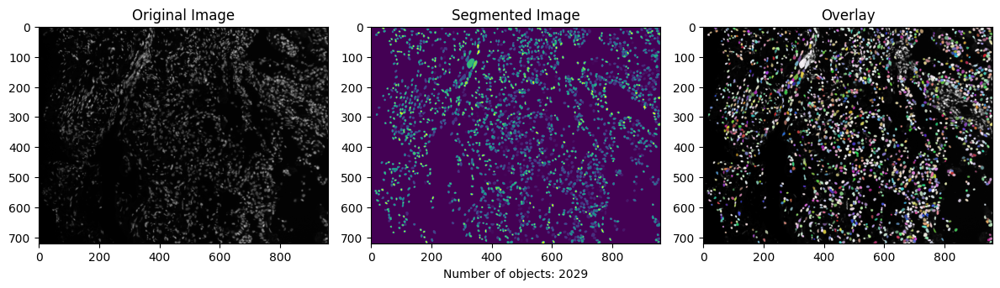

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00013_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00013_CH3


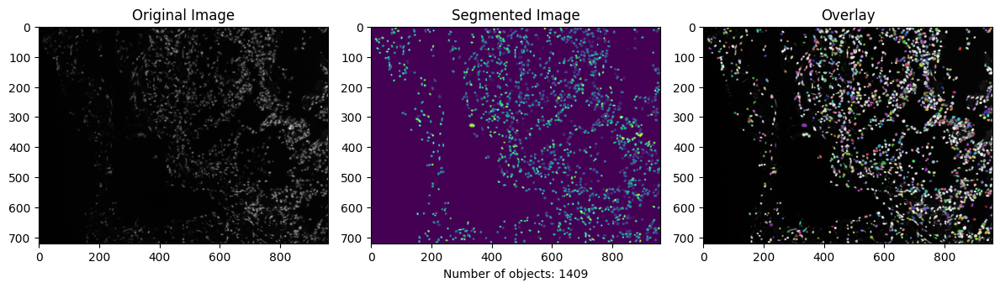

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00014_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00014_CH3


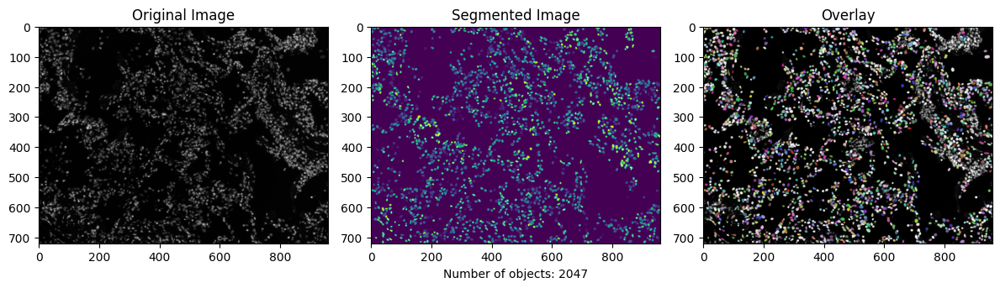

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00015_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00015_CH3


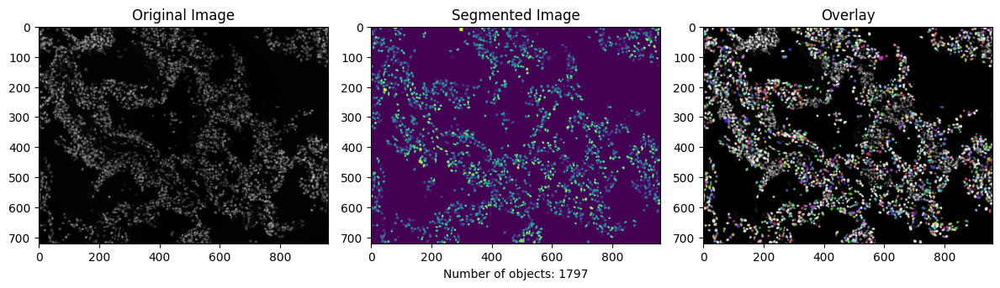

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00016_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00016_CH3


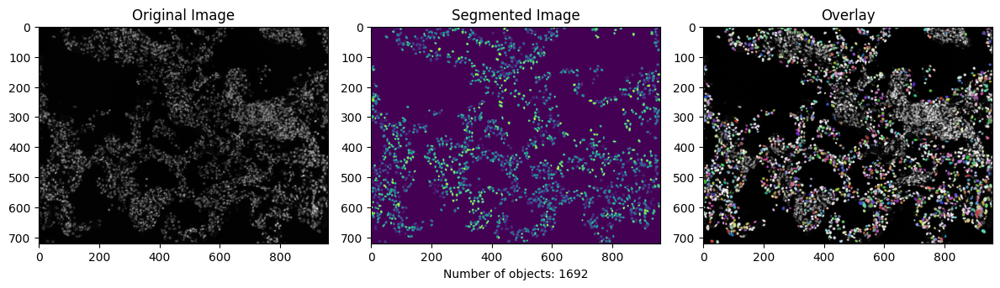

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00017_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00017_CH3


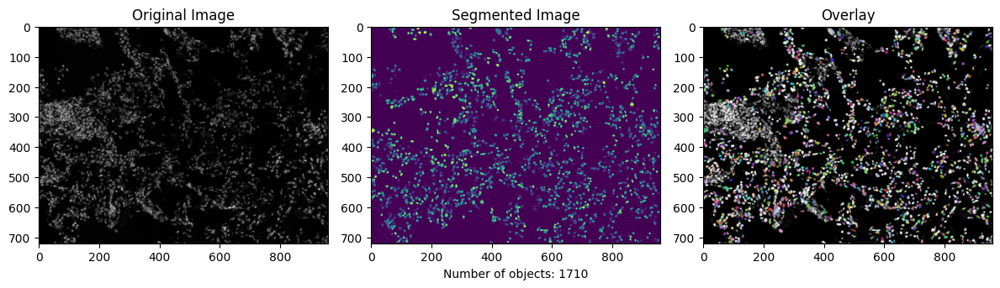

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00019_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00019_CH3


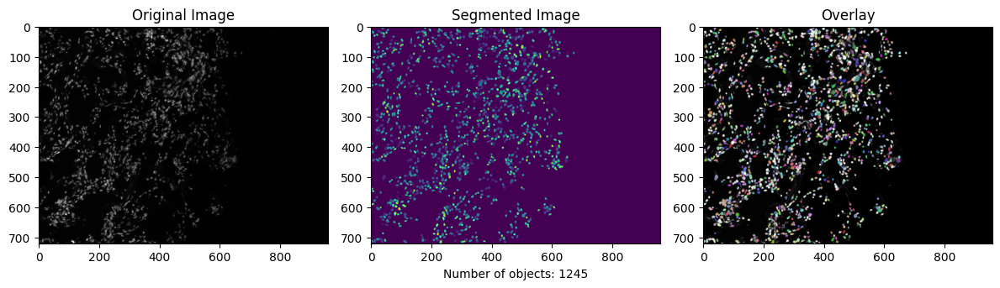

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00020_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00020_CH3


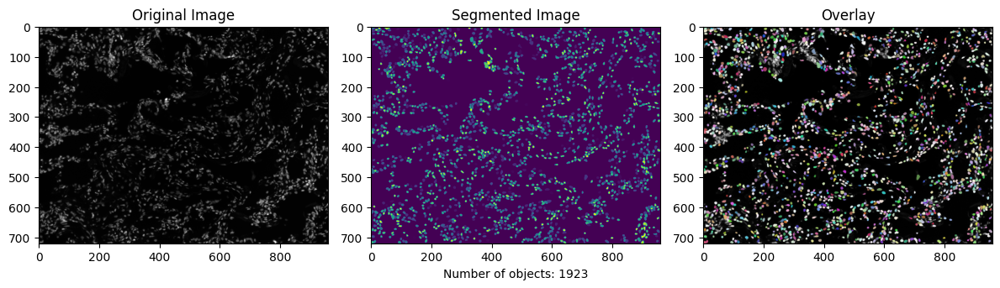

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00021_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00021_CH3


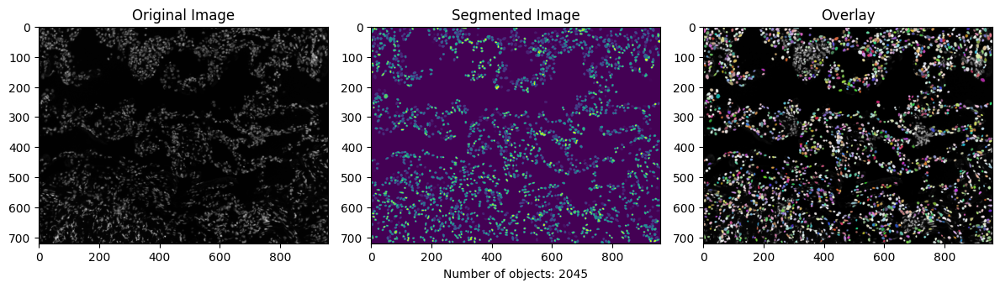

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00022_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00022_CH3


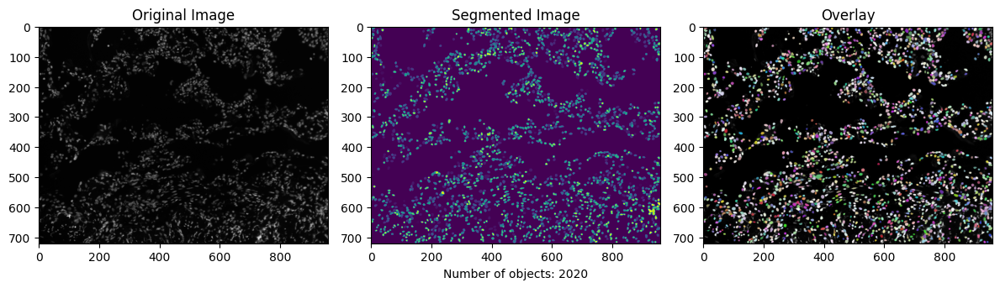

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00023_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00023_CH3


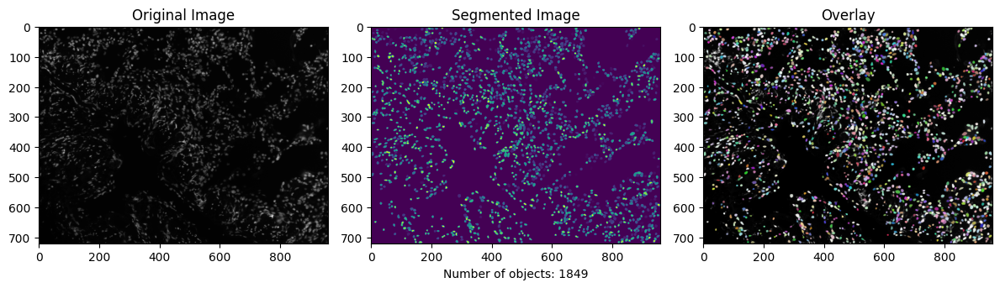

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00026_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00026_CH3


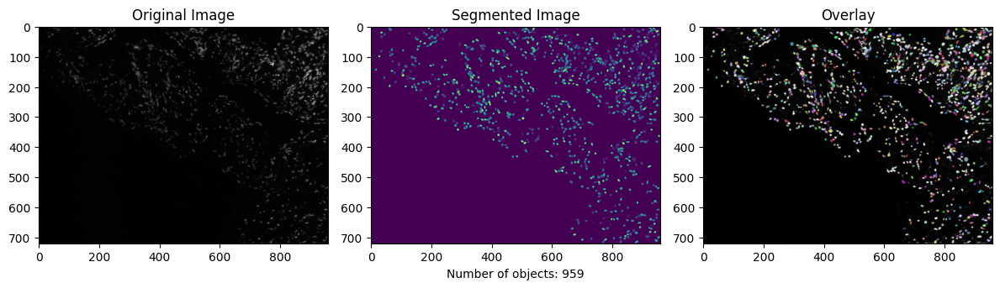

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00027_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00027_CH3


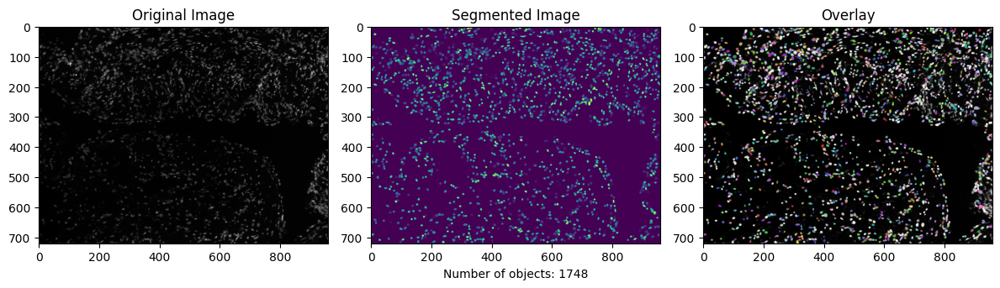

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00028_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00028_CH3


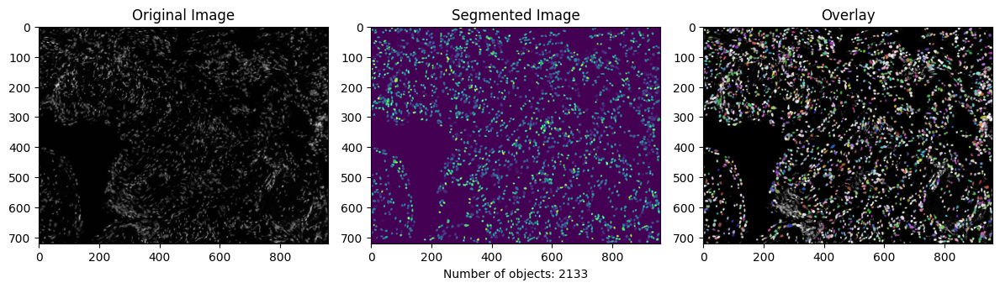

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00029_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00029_CH3


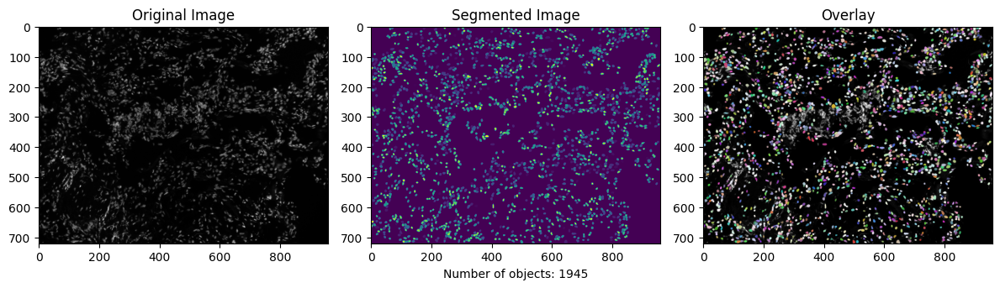

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00030_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00030_CH3


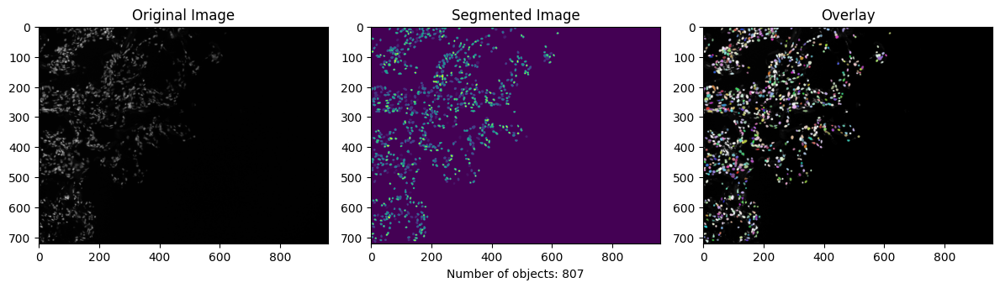

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00031_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00031_CH3


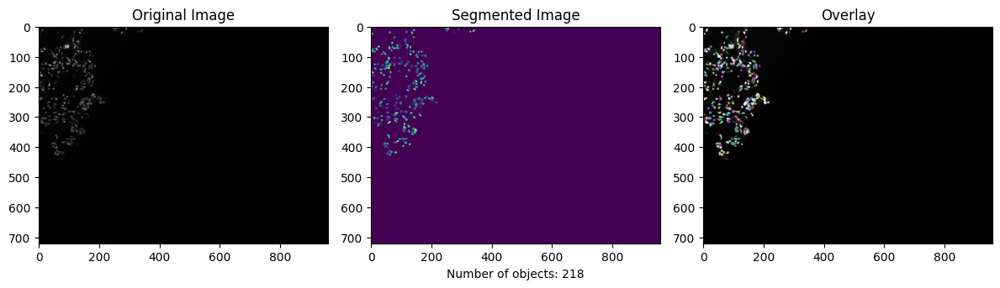

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00033_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00033_CH3


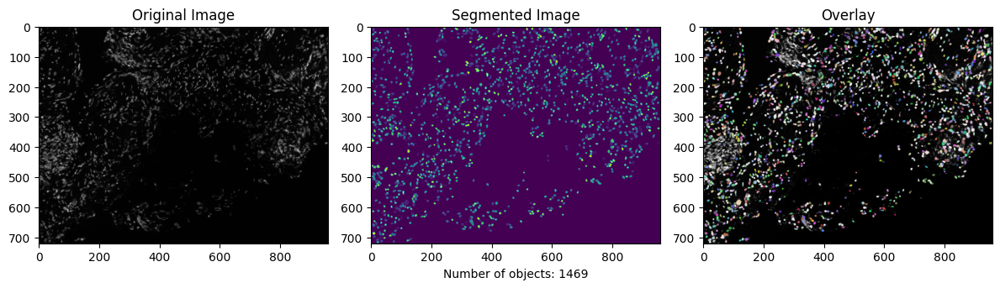

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00034_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00034_CH3


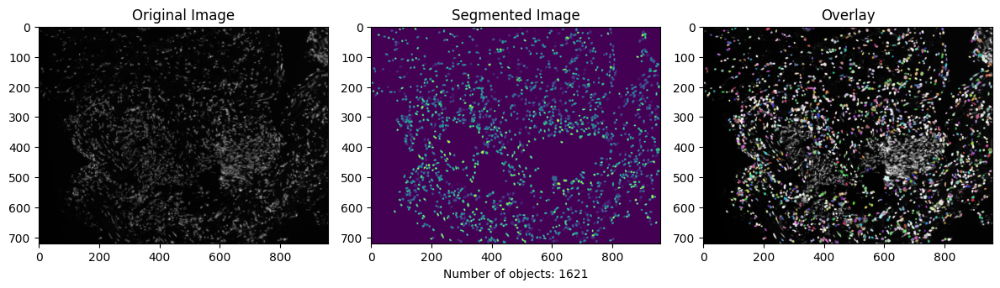

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00039_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00039_CH3


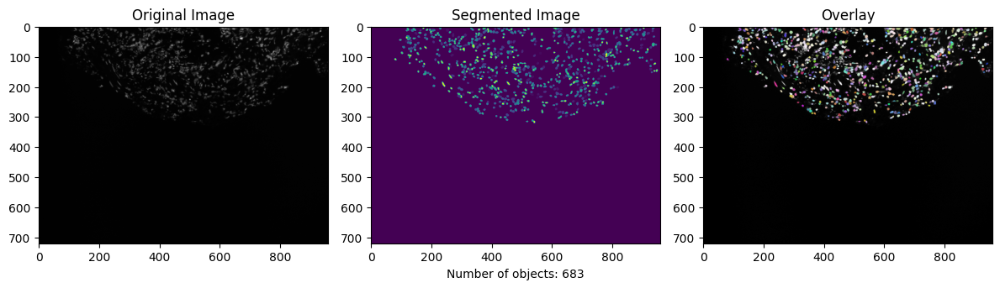

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_Muc1_Ecad_SPC_x20_2_XY10_00040_CH3.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_Muc1_Ecad_SPC_x20_2_XY10_00040_CH3


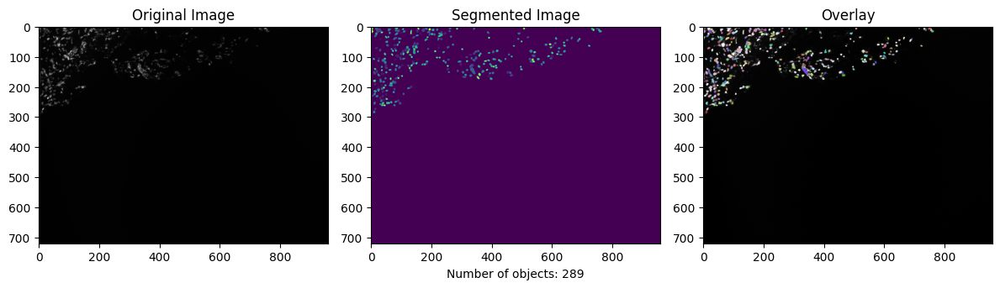

Saved: /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/segmented_views/segmented_example_fluo.png
Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_example_fluo


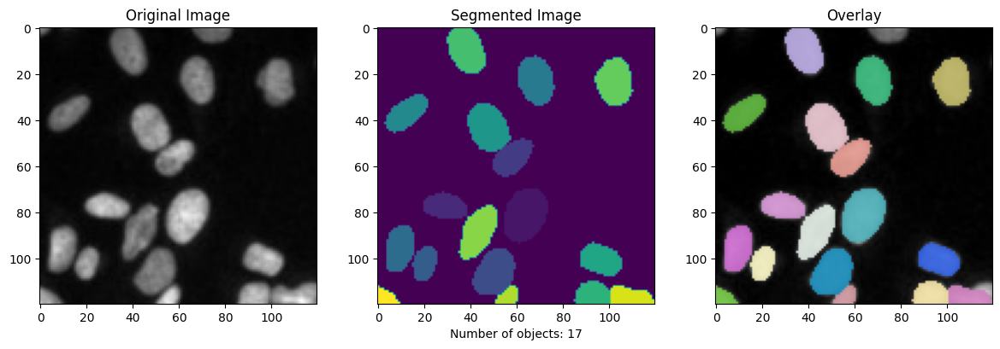

In [87]:
AFF_bool = True
SAVE_bool = True

for i in range(len(IMAGES_LIST)):
    image = IMAGES_LIST[i]

    # PREDICTION
    segmented_image, details = model.predict_instances(normalize(image))
    image_name = os.path.splitext(os.path.basename(IMAGES_PATH_LIST[i]))[0]

    if SAVE_bool:
        # Extract the image file name without the extension and prepare the new file name


        output_image_path = os.path.join(SEGMENTEDVIEWS_RESULTS_DIR_PATH, f"segmented_{image_name}.png")

        # Convert labels to an image
        pil_segmented_image = Image.fromarray(segmented_image.astype('uint8'))
        pil_segmented_image.save(output_image_path)
        print(f"Saved: {output_image_path}")

    if AFF_bool:
        # overlay
        overlay = render_label(segmented_image, img=image, alpha=0.9) #color.label2rgb(labels, image=image, bg_label=0, bg_color=(0, 0, 0), kind='overlay')
        nbr_obj = max(np.unique(segmented_image))

        MediaPlayer.display_images(images=[image, segmented_image, overlay],
                                   titles=["Original Image", "Segmented Image", "Overlay"],
                                   x_labels=['', f'Number of objects: {nbr_obj}', ''],
                                   cmaps=[None, 'viridis', None],
                                   details=[None, None, None],
                                   save_path=OVERVIEWS_RESULTS_DIR_PATH+f'/overview_{image_name}')



## Results - w/ Patchs

In [88]:
def create_patches(images_list, patch_size=(100, 100)):
    """
    Divides each image in a list into non-overlapping patches.

    Args:
        images_list (list of np.array): List of images (each image is a NumPy array).
        patch_size (tuple): Tuple indicating the height and width of each patch.

    Returns:
        list of np.array: List of patches extracted from each image.
    """
    patches_list = []
    patch_height, patch_width = patch_size

    # Loop over each image in the list
    for image in images_list:
        img_height, img_width = image.shape

        # Generate patches from the image
        for i in range(0, img_height, patch_height):
            for j in range(0, img_width, patch_width):
                # Extract the patch
                patch = image[i:i+patch_height, j:j+patch_width]
                # Check if the patch size matches the desired size (it might not at image boundaries)
                if patch.shape[0] == patch_height and patch.shape[1] == patch_width:
                    patches_list.append(patch)

    return patches_list

PATCHES_LIST = create_patches(IMAGES_LIST, patch_size=(100, 100))

[[ 2  2  2 ...  4  3  3]
 [ 2  2  2 ... 12  4  2]
 [ 2  2  2 ... 15  9  3]
 ...
 [ 2  2  2 ...  2  3  2]
 [ 2  2  2 ...  2  3  3]
 [ 2  2  2 ...  3  3  4]]
shape: (100, 100)
unique: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 51 52 53 54 55 57 58 59 60 61 62 63 64 65 66 67 69 70 71 73 74 75 76
 78 79 80 81 82 83 85 86 88 90]


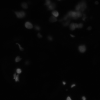

In [89]:
# Visualize one patch
patch = PATCHES_LIST[20]
patch_pil = Image.fromarray(patch.astype(np.uint8))

# Print image properties and unique values (helpful for debugging)
print(patch)
print('shape:', patch.shape)
print('unique:', np.unique(patch))

# Visualize
patch_pil

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
shape: (100, 100)
unique: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]
len(unique): 23


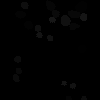

In [90]:
if len(np.unique(patch)) > 5: # we can run the model if the image is blank
    segmented_patch, details = model.predict_instances(normalize(patch))
else:
    segmented_patch = np.zeros(patch.shape)

# Print image properties and unique values (helpful for debugging)
print(segmented_patch)
print('shape:', segmented_patch.shape)
print('unique:', np.unique(segmented_patch))
print('len(unique):', len(np.unique(segmented_patch)))

# Visualize the image
segmented_patch_pil = Image.fromarray(segmented_patch.astype(np.uint8))#, 'L')
segmented_patch_pil


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00001_CH3


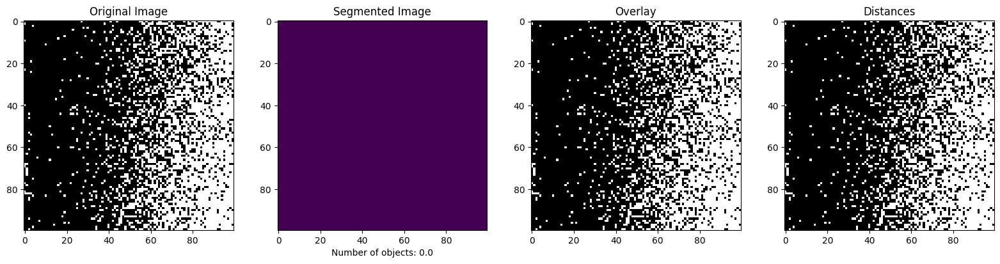


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00002_CH3


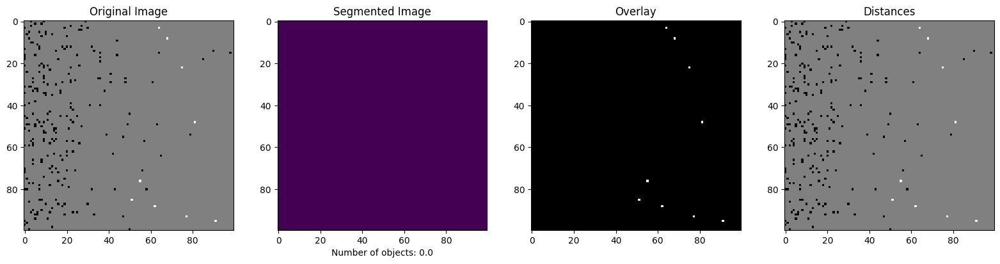


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00007_CH3


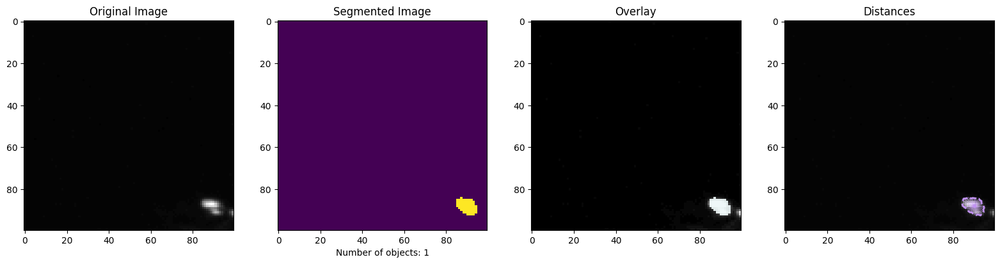


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00008_CH3


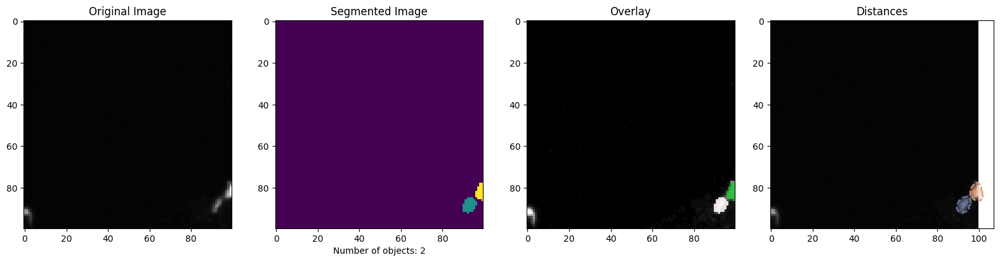


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00009_CH3


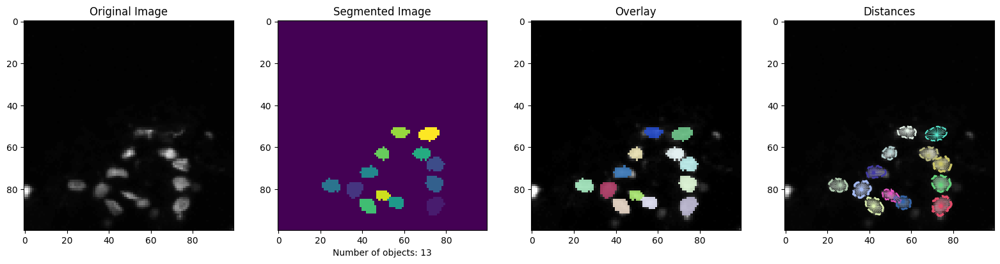


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00010_CH3


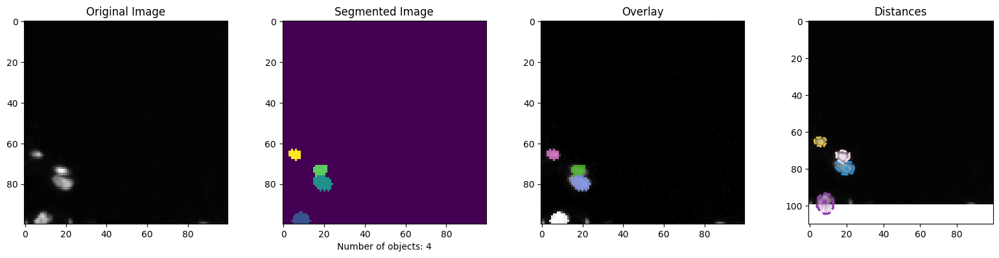


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00011_CH3


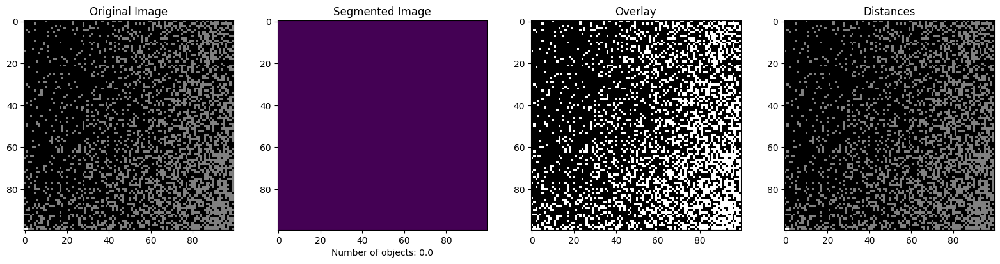


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00012_CH3


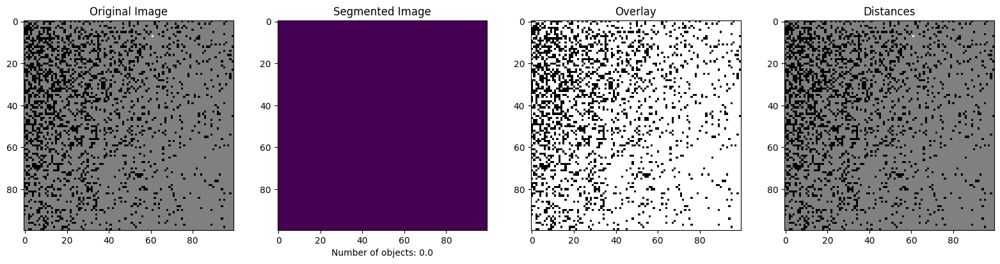


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00013_CH3


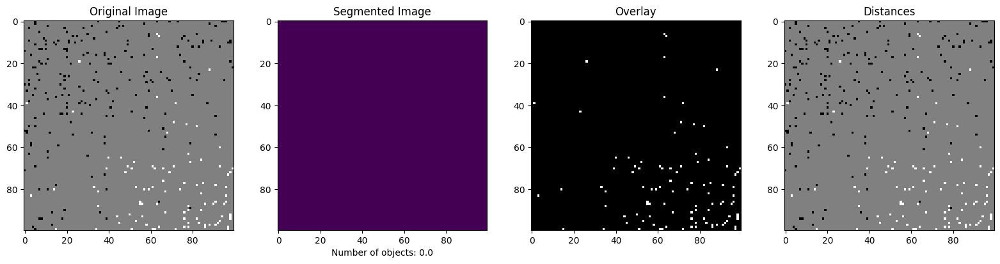


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00014_CH3


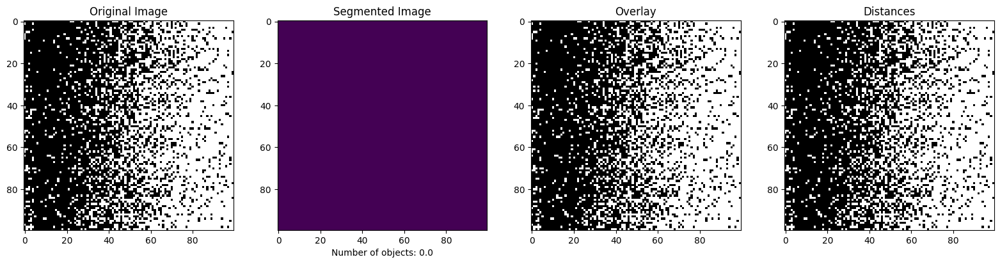


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00015_CH3


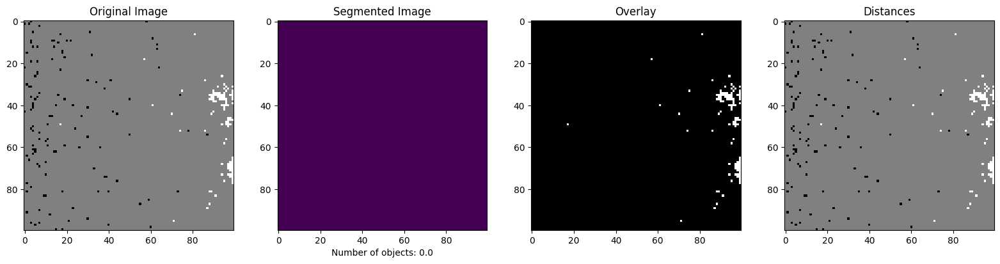


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00016_CH3


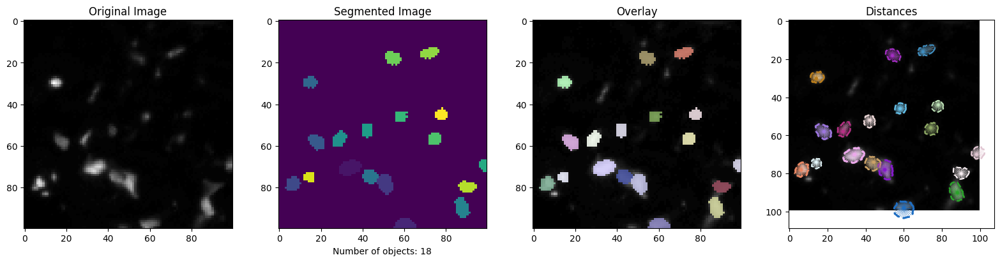


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00017_CH3


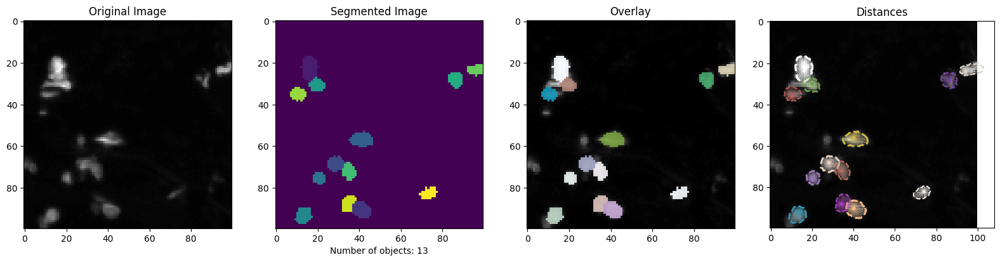


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00019_CH3


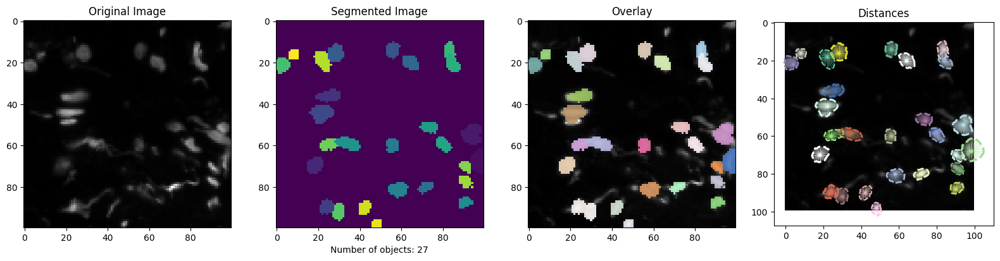


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00020_CH3


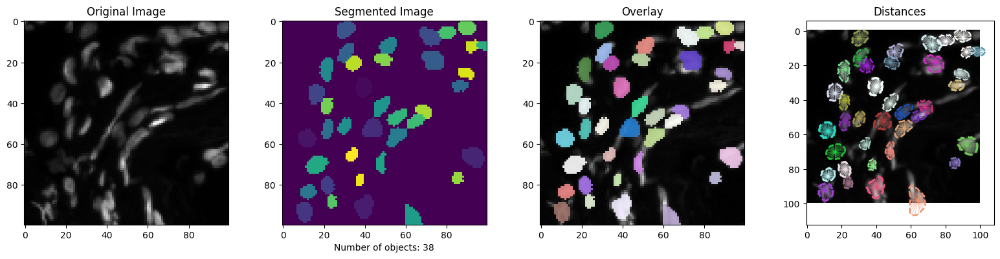


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00021_CH3


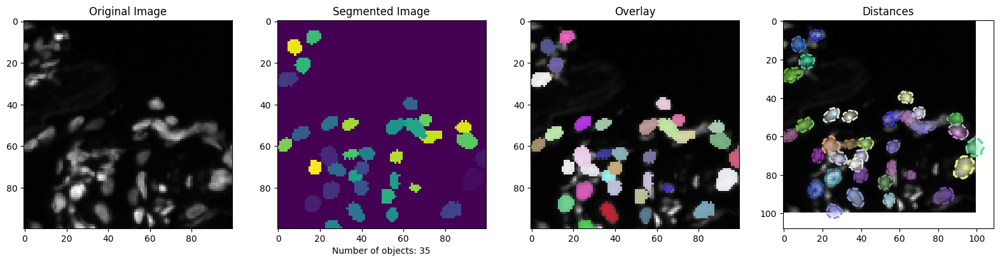


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00022_CH3


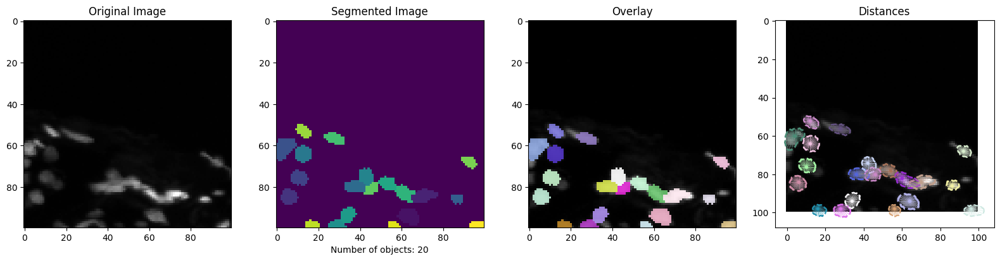


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00023_CH3


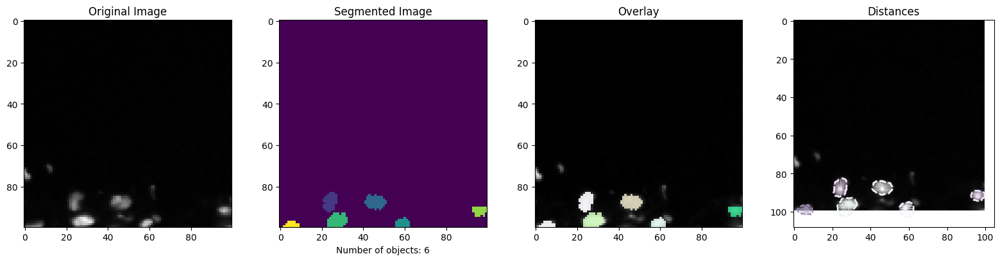


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00026_CH3


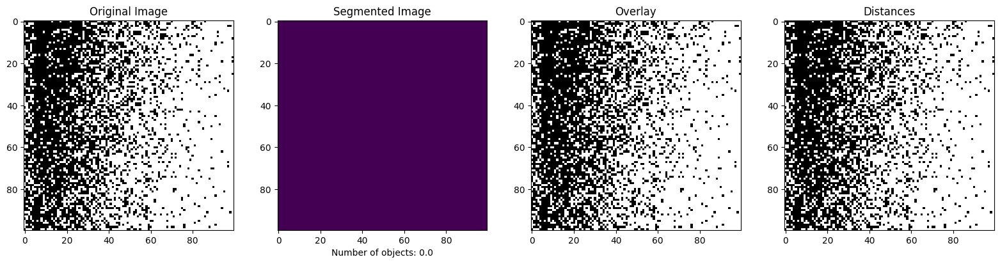


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00027_CH3


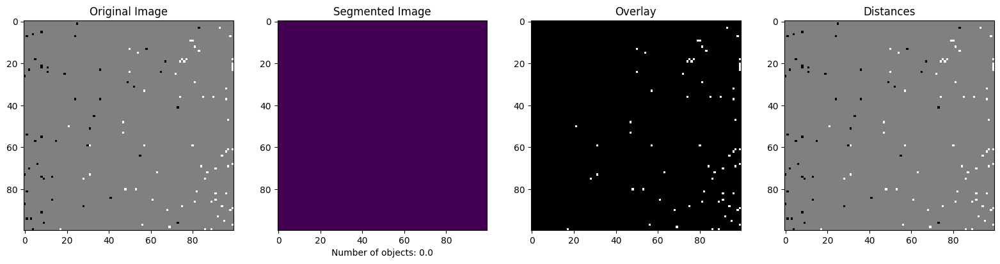


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00028_CH3


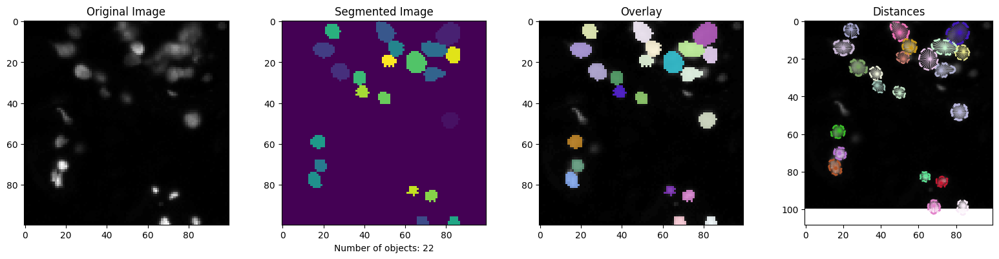


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00029_CH3


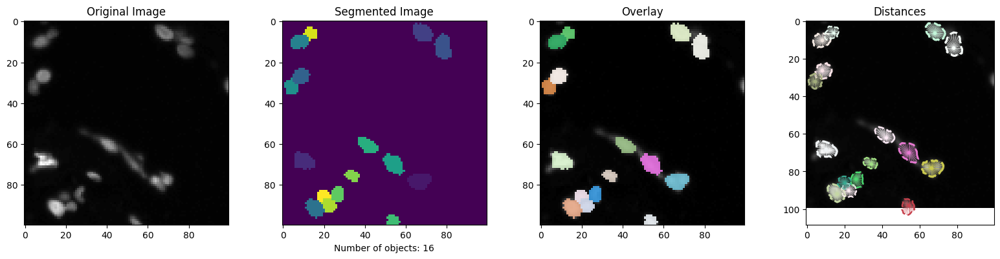


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00030_CH3


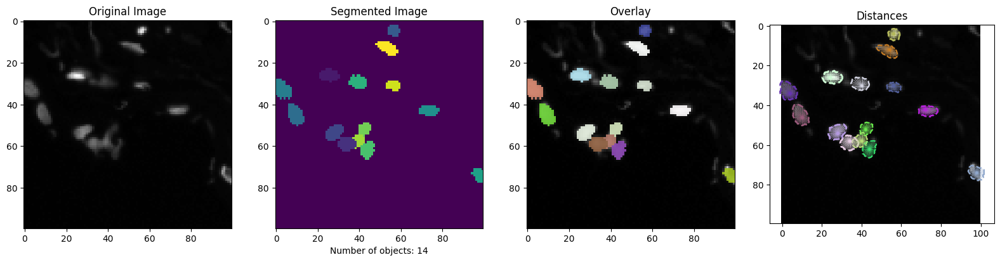


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00031_CH3


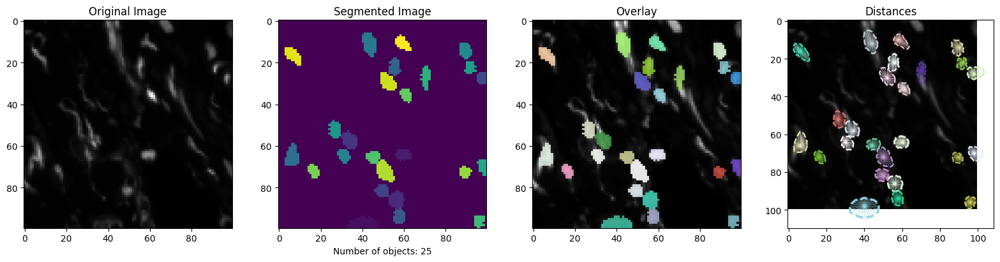


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00033_CH3


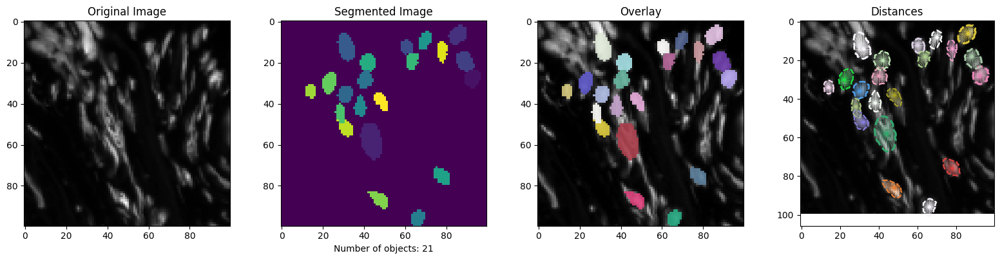


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00034_CH3


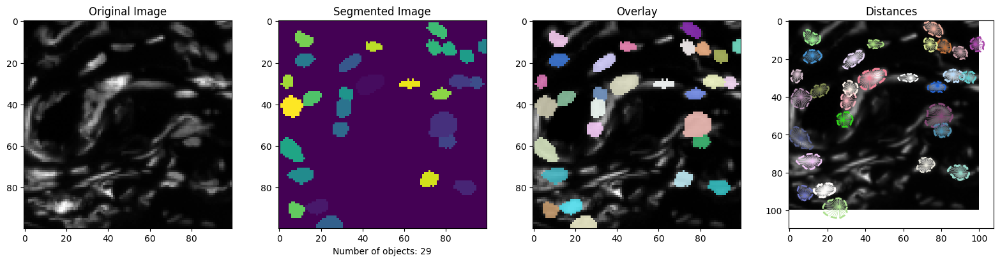


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00039_CH3


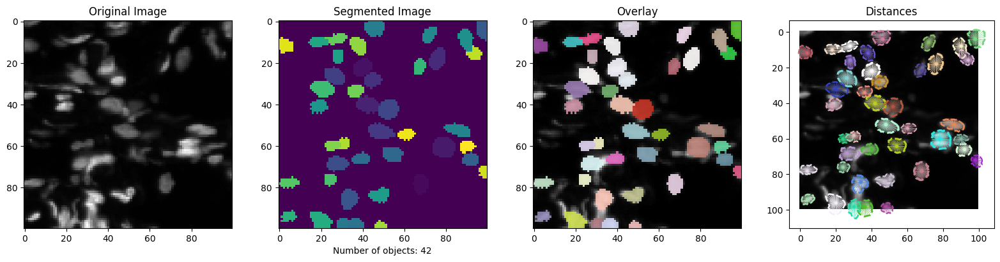


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_Muc1_Ecad_SPC_x20_2_XY10_00040_CH3


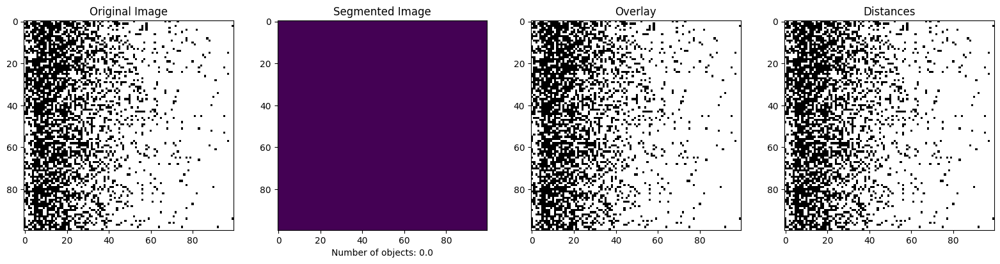


Saved plot to /content/drive/MyDrive/Colab Notebooks/StarDist/output_2D_versatile_fluo_2024-04-30-23/overviews/overview_patch100_example_fluo


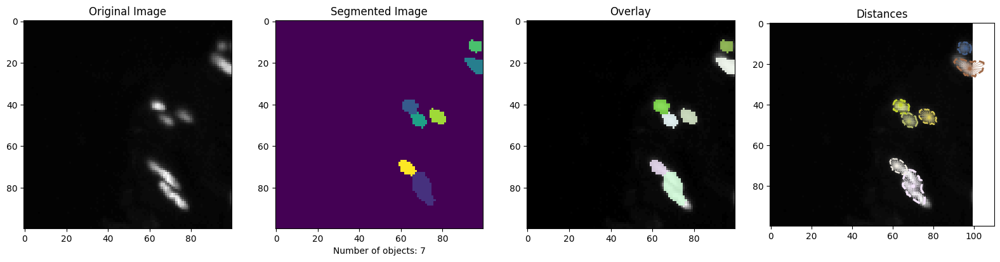

IndexError: list index out of range

In [91]:
AFF_bool = True
SAVE_bool = False

for i in range(len(PATCHES_LIST)):
    image = PATCHES_LIST[i]
    print()
    # PREDICT
    if len(np.unique(image)) > 5: # we can run the model if the image is blank
        segmented_image, details = model.predict_instances(normalize(image))
    else:
        segmented_image, details = np.zeros(image.shape), None

    image_name = 'patch100_' + os.path.splitext(os.path.basename(IMAGES_PATH_LIST[i]))[0]

    if SAVE_bool:
        # Extract the image file name without the extension and prepare the new file name

        output_image_path = os.path.join(SEGMENTEDVIEWS_RESULTS_DIR_PATH, f"segmented_{image_name}.png")

        # Convert labels to an image
        pil_segmented_image = Image.fromarray(segmented_image.astype('uint8'))
        pil_segmented_image.save(output_image_path)
        print(f"Saved: {output_image_path}")

    if AFF_bool:
        # overlay
        overlay = render_label(segmented_image, img=image, alpha=0.9) #color.label2rgb(labels, image=image, bg_label=0, bg_color=(0, 0, 0), kind='overlay')
        nbr_obj = max(np.unique(segmented_image))

        MediaPlayer.display_images(images=[image, segmented_image, overlay, image],
                                   titles=["Original Image", "Segmented Image", "Overlay", "Distances"],
                                   x_labels=['', f'Number of objects: {nbr_obj}', '', ''],
                                   cmaps=[None, 'viridis', None, None],
                                   details=[None, None, None, details],
                                   save_path=OVERVIEWS_RESULTS_DIR_PATH+f'/overview_{image_name}')

